# 0. Packages and Data

In [12]:
!git clone https://github.com/folsomcp/specpolFlow

fatal: destination path 'specpolFlow' already exists and is not an empty directory.


In [13]:
!git clone https://github.com/folsomcp/LSDpy

fatal: destination path 'LSDpy' already exists and is not an empty directory.


In [14]:
%cd /LSDpy

c:\LSDpy


In [15]:
import lsdpy

In [18]:
cd Users/pjsta/GitHub/BeStarsMiMeS

c:\Users\pjsta\GitHub\BeStarsMiMeS


In [22]:
import specpolFlow as pol
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
import astropy.constants as const
from matplotlib.backends.backend_pdf import PdfPages


In [20]:
import pandas as pd
sheet_id = '1M6y1Wnsrc-w5FjUMfKaSFa_-foIDAaMe8W4lYNWnWyk'
sheet_name = 'Stars'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
StarData=pd.read_csv(url)

sheet_name = 'Observations'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
Observations=pd.read_csv(url)

# 1. Hybrid/cleaned versus real/Asif

C:\Users\pjsta\AppData\Local\Temp/ipykernel_8448/767658838.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(4,1, figsize=(10,10))


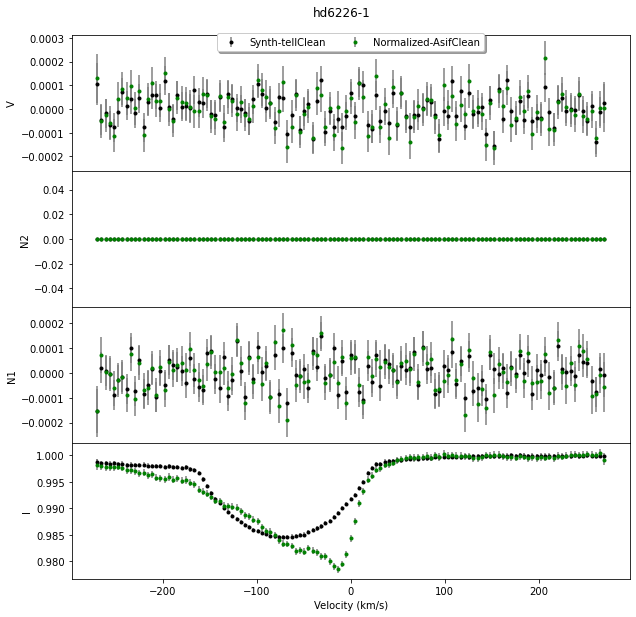

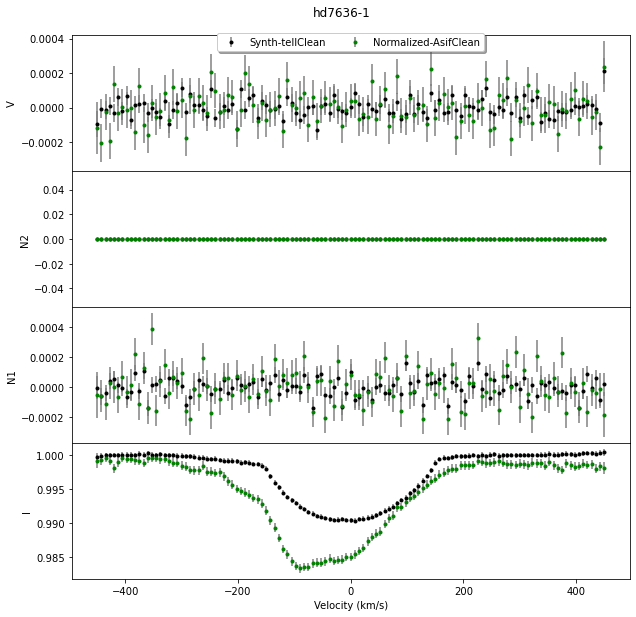

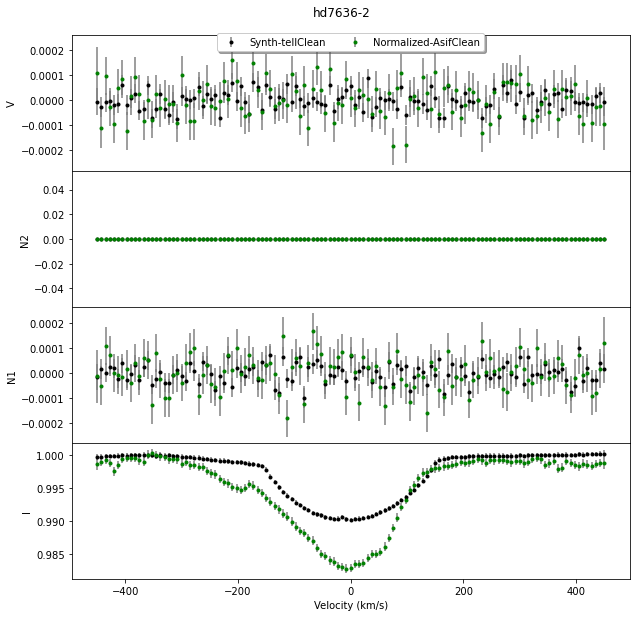

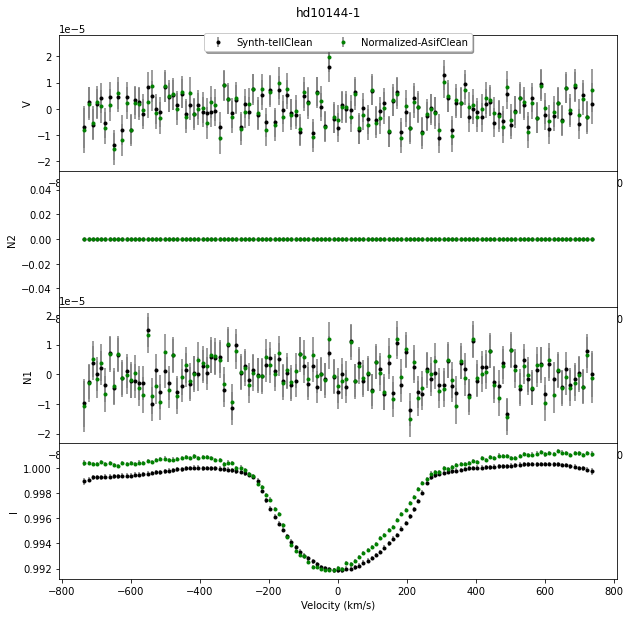

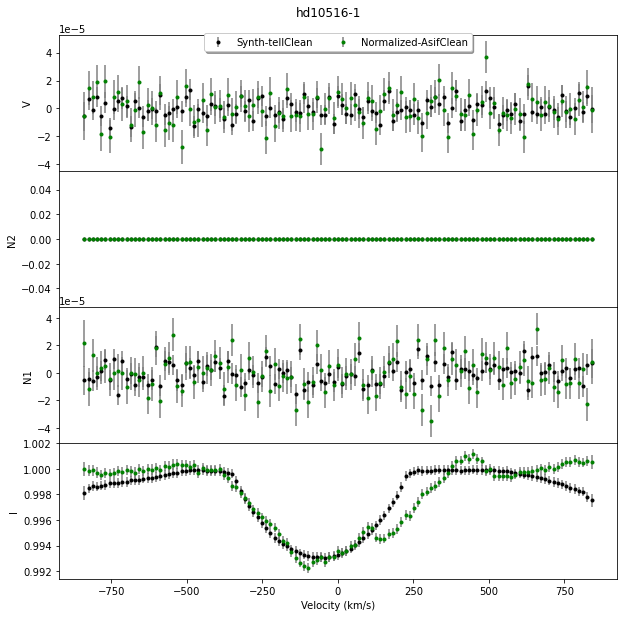

...

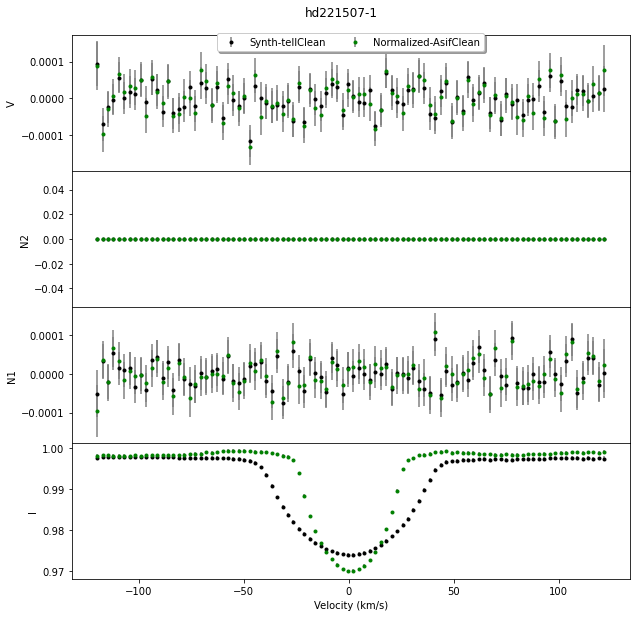

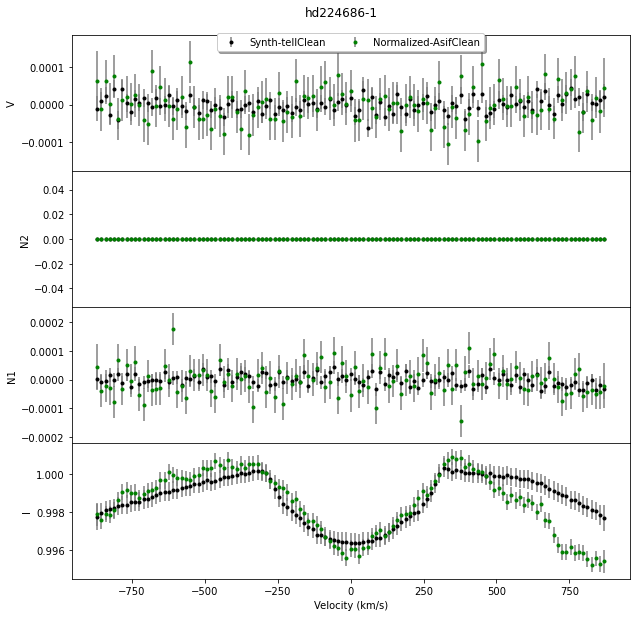

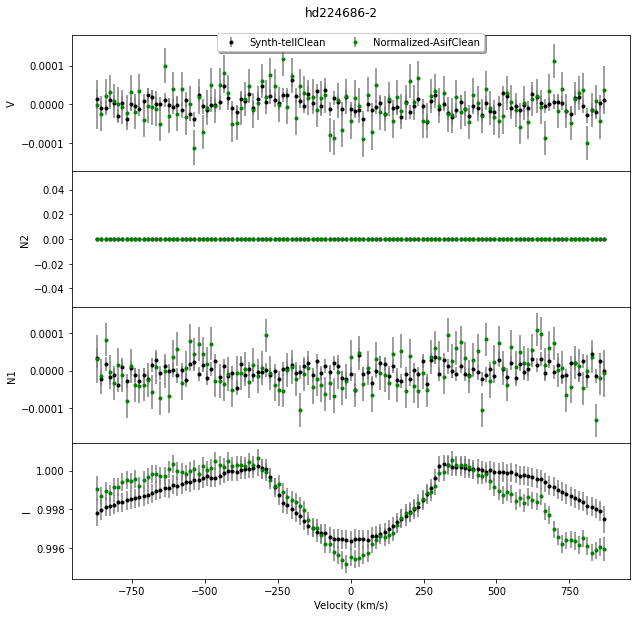

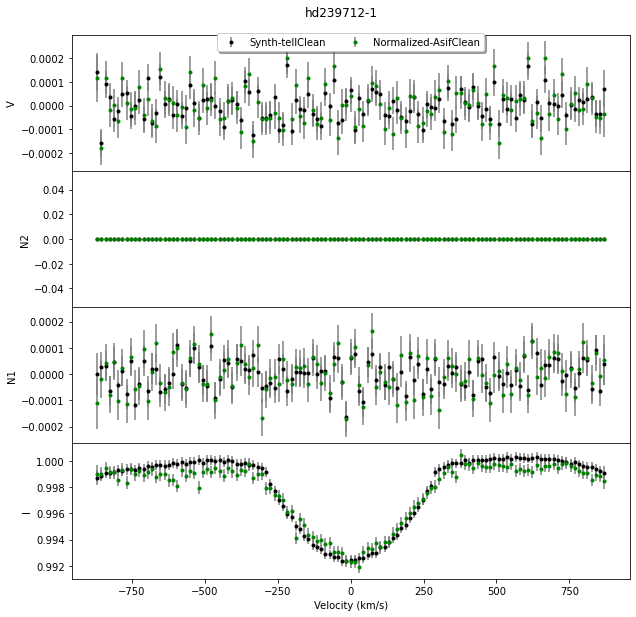

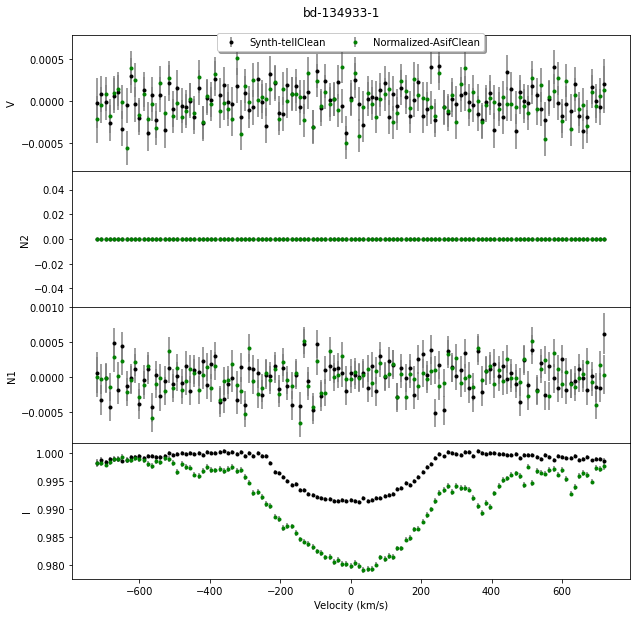

In [34]:

with PdfPages('HybridCleaned_vs_RealAsif.pdf') as pdf:

  for i, ObsInfo in Observations.iterrows():
    
    star = ObsInfo["Name"]
    obs =ObsInfo["Unnamed: 2"]

    lsdfolder1 = '03-LSD-calculations/LSD/hybrid_maskdepth0.02_tellClean'
    lsdfolder4 = '03-LSD-calculations/LSD/normalized_CleanAsif+tellClean'

    outfile1 = '{}/{}_{}.lsd'.format(lsdfolder1, star,obs)
    outfile4 = '{}/{}_{}.lsd'.format(lsdfolder4, star,obs)

    lsd1 = pol.iolsd.read_lsd(outfile1)
    lsd4 = pol.iolsd.read_lsd(outfile4)

    fig, ax = plt.subplots(4,1, figsize=(10,10))

    ax[3].errorbar(lsd1.vel, lsd1.specI, yerr=lsd1.specSigI, xerr=None, fmt='o', ms=3,ecolor='0.5',c='k')
    ax[3].errorbar(lsd4.vel, lsd4.specI, yerr=lsd4.specSigI, xerr=None, fmt='o', ms=3,ecolor='0.5',c='g')
  
    ax[2].errorbar(lsd1.vel, lsd1.specN1, yerr=lsd1.specSigN1, xerr=None, fmt='o', ms=3,ecolor='0.5',c='k')
    ax[2].errorbar(lsd4.vel, lsd4.specN1, yerr=lsd4.specSigN1, xerr=None, fmt='o', ms=3,ecolor='0.5',c='g')

    ax[1].errorbar(lsd1.vel, lsd1.specN2, yerr=lsd1.specSigN2, xerr=None, fmt='o', ms=3,ecolor='0.5',c='k')
    ax[1].errorbar(lsd4.vel, lsd4.specN2, yerr=lsd4.specSigN2, xerr=None, fmt='o', ms=3,ecolor='0.5',c='g')

    ax[0].errorbar(lsd1.vel, lsd1.specV, yerr=lsd1.specSigV, xerr=None, fmt='o', ms=3, ecolor='0.5',c='k',label='Synth-tellClean')
    ax[0].errorbar(lsd4.vel, lsd4.specV, yerr=lsd4.specSigV, xerr=None, fmt='o', ms=3, ecolor='0.5',c='g',label='Normalized-AsifClean')

    plt.subplots_adjust(hspace=.0)
    ax[3].set_xlabel('Velocity (km/s)')
    ax[3].set_ylabel('I')
    ax[2].set_ylabel('N1')
    ax[1].set_ylabel('N2')
    ax[0].set_ylabel('V')
    fig.suptitle(star + '-'+ str(obs),y=0.92)
    
    ax[0].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),
          ncol=3, fancybox=True, shadow=True)

    pdf.savefig(fig)